In [2]:
import sys, platform,os
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
%matplotlib inline

import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
py.init_notebook_mode(connected=True)

import matplotlib
from matplotlib.pyplot import *
from numpy import *
from pandas import *

import warnings
warnings.filterwarnings('ignore')

In [3]:
# Set a seed for reproducibility
SEED = 7
np.random.seed(SEED)

## 1. Data Preparing for clinical infomations

In [4]:
#Load data and observation
pd.set_option('display.max_columns', None)
df = pd.read_csv('sc3_Training_ClinAnnotations.csv', sep = ',')
print(df.shape)
df.info()

(583, 44)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 583 entries, 0 to 582
Data columns (total 44 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Study                            583 non-null    object 
 1   Patient                          583 non-null    object 
 2   D_Age                            583 non-null    int64  
 3   D_Gender                         583 non-null    object 
 4   D_OS                             583 non-null    int64  
 5   D_OS_FLAG                        583 non-null    int64  
 6   D_PFS                            583 non-null    int64  
 7   D_PFS_FLAG                       583 non-null    int64  
 8   D_ISS                            563 non-null    float64
 9   PatientType                      583 non-null    object 
 10  MA_probeLevelExpFile             0 non-null      float64
 11  MA_probeLevelExpFileSamplId      0 non-null      float64
 12  MA_geneLevel

In [5]:
## Detect the full empty columns
df_na=[feature for feature in df.columns if df[feature].isnull().sum()>0]
df_na

['D_ISS',
 'MA_probeLevelExpFile',
 'MA_probeLevelExpFileSamplId',
 'MA_geneLevelExpFile',
 'MA_geneLevelExpFileSamplId',
 'RNASeq_mutationFileMutect',
 'RNASeq_mutationFileStrelkaIndel',
 'RNASeq_mutationFileStrelkaSNV',
 'RNASeq_FusionFile',
 'CYTO_predicted_feature_04',
 'CYTO_predicted_feature_07',
 'CYTO_predicted_feature_09',
 'CYTO_predicted_feature_10',
 'CYTO_predicted_feature_11']

In [6]:
#keep the rest data
pd.set_option('display.max_columns', None)
df_keep=df.drop(df_na,axis=1)

In [7]:
# clean the columns which have same values
nunique = df_keep.nunique()
cols_to_drop = nunique[nunique == 1].index
print("The column have only one value:",cols_to_drop)
df_clean=df_keep.drop(cols_to_drop, axis=1)

The column have only one value: Index(['Study', 'PatientType', 'RNASeq_transLevelExpFile',
       'RNASeq_geneLevelExpFile'],
      dtype='object')


In [8]:
#clean the columns that don't give so much informations
df_allClean=df_clean.drop(['Patient','RNASeq_transLevelExpFileSamplId', 'WES_mutationFileMutect','WES_mutationFileStrelkaIndel','WES_mutationFileStrelkaSNV'], axis=1)

In [9]:
#check the label of HR_FLAG
df_allClean['HR_FLAG'].value_counts()

FALSE       261
CENSORED    191
TRUE        131
Name: HR_FLAG, dtype: int64

In [9]:
df_censored=df_allClean[df_allClean['HR_FLAG']=="CENSORED"]

In [10]:
#check the number of patient who we categorize to high risk, OS and PFS need to be more than 18 months
df_nonHR_samples = df_censored[
 (df_censored['D_OS'] > (365 / 12) * 18) &
 (df_censored['D_PFS'] > (365 / 12) * 18)
]
df_nonHR_samples

,D_Age,D_Gender,D_OS,D_OS_FLAG,D_PFS,D_PFS_FLAG,RNASeq_geneLevelExpFileSamplId,CYTO_predicted_feature_01,CYTO_predicted_feature_02,CYTO_predicted_feature_03,CYTO_predicted_feature_05,CYTO_predicted_feature_06,CYTO_predicted_feature_08,CYTO_predicted_feature_12,CYTO_predicted_feature_13,CYTO_predicted_feature_14,CYTO_predicted_feature_15,CYTO_predicted_feature_16,CYTO_predicted_feature_17,CYTO_predicted_feature_18,HR_FLAG
393,61,Male,548,0,548,0,MMRF_2141_1_BM,0,0,0,0,0,0,0,0,0,0,0,0,0,CENSORED


In [21]:
#the patients have high risks of die, is the OS and PFS more than 18 months,
#the patients have low risks of die, is the OS or PFS less than 18 months,

df_allClean.loc[df_allClean['HR_FLAG'].eq('CENSORED')& (df_allClean.D_OS > (365 / 12) * 18) &
 (df_allClean.D_PFS > (365 / 12) * 18), 'HR_FLAG'] = 'FALSE'
df_allClean.loc[df_allClean['HR_FLAG'].eq('CENSORED')&(df_allClean.D_OS < (365 / 12) * 18) |
 (df_allClean.D_PFS < (365 / 12) * 18), 'HR_FLAG'] = 'TRUE'
df_allClean

,D_Age,D_Gender,D_OS,D_OS_FLAG,D_PFS,D_PFS_FLAG,RNASeq_geneLevelExpFileSamplId,CYTO_predicted_feature_01,CYTO_predicted_feature_02,CYTO_predicted_feature_03,CYTO_predicted_feature_05,CYTO_predicted_feature_06,CYTO_predicted_feature_08,CYTO_predicted_feature_12,CYTO_predicted_feature_13,CYTO_predicted_feature_14,CYTO_predicted_feature_15,CYTO_predicted_feature_16,CYTO_predicted_feature_17,CYTO_predicted_feature_18,HR_FLAG
0,54,Female,1575,0,623,1,MMRF_1021_1_BM,0,0,1,0,1,0,0,0,0,0,0,0,0,FALSE
1,46,Male,995,0,995,0,MMRF_1029_1_BM,0,0,1,0,0,0,0,0,0,0,0,0,0,FALSE
2,65,Female,1572,0,1572,0,MMRF_1030_1_BM,0,0,1,0,0,1,0,0,0,1,0,0,0,FALSE
3,62,Male,1581,0,1329,1,MMRF_1031_1_BM,0,0,1,0,0,0,0,0,0,0,0,0,0,FALSE
4,76,Male,934,1,908,1,MMRF_1032_1_BM,0,0,1,0,0,1,0,0,0,0,0,0,0,FALSE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
578,67,Male,335,0,335,0,MMRF_2608_1_BM,0,0,1,0,0,1,0,0,0,0,1,0,0,TRUE
579,66,Female,247,0,246,0,MMRF_2611_1_BM,0,0,1,1,0,1,0,1,0,0,0,1,0,TRUE
580,70,Female,253,0,253,0,MMRF_2613_1_BM,0,0,0,0,0,0,0,0,0,0,0,0,0,TRUE
581,58,Male,290,0,290,0,MMRF_2614_1_BM,1,1,0,0,1,0,1,0,0,0,1,0,0,TRUE


In [12]:
df_allClean['HR_FLAG'].value_counts()

TRUE     321
FALSE    262
Name: HR_FLAG, dtype: int64

## 2. Data Pre-processing for RNAseq data

In [13]:
df_mmrf = pd.read_csv('MMRF_CoMMpass_IA9_E74GTF_Salmon_entrezID_TPM_hg19.csv', sep = ',',index_col=0)
df_mmrf

,MMRF_2490_1_BM,MMRF_2499_1_BM,MMRF_1089_1_BM,MMRF_1778_1_BM,MMRF_1777_1_BM,MMRF_1153_1_BM,MMRF_1392_1_BM,MMRF_1325_1_BM,MMRF_1846_1_BM,MMRF_1935_1_BM,MMRF_1654_1_BM,MMRF_1897_1_BM,MMRF_1682_1_BM,MMRF_2339_1_BM,MMRF_2199_1_BM,MMRF_2118_1_BM,MMRF_2487_1_BM,MMRF_2567_1_BM,MMRF_1738_1_BM,MMRF_1695_1_BM,MMRF_2611_1_BM,MMRF_1537_1_BM,MMRF_2267_1_BM,MMRF_1672_1_BM,MMRF_1715_1_BM,MMRF_2404_1_BM,MMRF_1637_1_BM,MMRF_2412_1_BM,MMRF_1640_1_BM,MMRF_1171_1_BM,MMRF_1851_1_PB,MMRF_2378_1_BM,MMRF_2141_1_BM,MMRF_1261_1_BM,MMRF_1648_1_BM,MMRF_2641_1_BM,MMRF_2314_1_BM,MMRF_2646_1_BM,MMRF_2017_1_BM,MMRF_1188_1_BM,MMRF_2456_1_BM,MMRF_2455_1_BM,MMRF_2019_1_BM,MMRF_1344_1_BM,MMRF_1908_1_BM,MMRF_1383_1_BM,MMRF_1112_3_BM,MMRF_1605_1_BM,MMRF_2409_1_BM,MMRF_1867_1_BM,MMRF_1683_1_BM,MMRF_1720_1_BM,MMRF_1730_1_BM,MMRF_1073_1_BM,MMRF_2461_1_BM,MMRF_2330_1_BM,MMRF_1910_1_BM,MMRF_1539_1_BM,MMRF_2055_1_BM,MMRF_1470_1_BM,MMRF_1086_1_BM,MMRF_2201_1_BM,MMRF_1157_4_BM,MMRF_1773_1_BM,MMRF_2539_1_BM,MMRF_1888_1_BM,MMRF_1583_1_BM,MMRF_1474_1_BM,MMRF_1974_1_BM,MMRF_1793_1_BM,MMRF_1232_4_BM,MMRF_1356_1_BM,MMRF_1893_1_BM,MMRF_1269_1_BM,MMRF_2087_2_BM,MMRF_1256_2_BM,MMRF_2522_1_BM,MMRF_2336_1_BM,MMRF_1080_1_BM,MMRF_1242_1_BM,MMRF_1865_1_BM,MMRF_1408_1_BM,MMRF_1296_1_BM,MMRF_1216_1_BM,MMRF_1808_1_BM,MMRF_1266_1_BM,MMRF_2613_1_BM,MMRF_1485_1_BM,MMRF_1922_1_BM,MMRF_2091_1_BM,MMRF_1314_1_BM,MMRF_2601_1_BM,MMRF_1159_1_BM,MMRF_1824_1_BM,MMRF_1698_1_BM,MMRF_2526_1_BM,MMRF_1722_1_BM,MMRF_1859_1_BM,MMRF_1311_1_BM,MMRF_1180_1_BM,MMRF_2002_1_BM,MMRF_1961_1_BM,MMRF_1617_1_BM,MMRF_2062_1_BM,MMRF_1871_1_BM,MMRF_2089_1_BM,MMRF_1499_1_BM,MMRF_1589_1_BM,MMRF_1068_1_BM,MMRF_1831_1_BM,MMRF_1496_3_PB,MMRF_2440_1_BM,MMRF_2353_1_BM,MMRF_1373_1_BM,MMRF_1504_1_BM,MMRF_1842_1_BM,MMRF_1621_1_BM,MMRF_2329_1_BM,MMRF_2458_1_BM,MMRF_1792_1_BM,MMRF_1795_1_BM,MMRF_2216_1_BM,MMRF_1157_3_BM,MMRF_1550_1_BM,MMRF_1511_1_BM,MMRF_2515_1_BM,MMRF_2087_1_BM,MMRF_2026_1_BM,MMRF_1433_1_BM,MMRF_2602_1_BM,MMRF_2538_1_BM,MMRF_2568_1_BM,MMRF_1686_2_BM,MMRF_2400_1_BM,MMRF_2341_1_BM,MMRF_1630_1_BM,MMRF_1327_1_BM,MMRF_2300_1_BM,MMRF_2325_1_BM,MMRF_1952_1_BM,MMRF_1921_1_BM,MMRF_1861_1_BM,MMRF_1596_1_BM,MMRF_2590_1_BM,MMRF_2187_1_PB,MMRF_1169_1_BM,MMRF_2038_1_BM,MMRF_1436_1_BM,MMRF_2211_1_BM,MMRF_2225_1_BM,MMRF_1332_1_BM,MMRF_1061_3_BM,MMRF_1157_1_BM,MMRF_2043_1_BM,MMRF_2379_1_BM,MMRF_1951_1_BM,MMRF_1991_1_BM,MMRF_1900_1_BM,MMRF_2290_1_BM,MMRF_2200_1_BM,MMRF_2119_1_BM,MMRF_1690_1_BM,MMRF_2183_1_BM,MMRF_1130_1_BM,MMRF_1627_1_BM,MMRF_2489_1_BM,MMRF_1284_2_BM,MMRF_2039_1_BM,MMRF_1137_1_BM,MMRF_2050_1_BM,MMRF_1906_1_BM,MMRF_1185_1_BM,MMRF_2453_1_BM,MMRF_2215_1_BM,MMRF_1355_1_BM,MMRF_2438_1_BM,MMRF_1277_1_BM,MMRF_2016_1_BM,MMRF_1790_2_BM,MMRF_1030_1_BM,MMRF_2531_1_PB,MMRF_1971_1_BM,MMRF_2498_1_BM,MMRF_2367_1_BM,MMRF_1365_1_BM,MMRF_1634_1_BM,MMRF_2082_1_BM,MMRF_1506_1_BM,MMRF_1453_1_BM,MMRF_1391_1_BM,MMRF_2548_1_BM,MMRF_1349_1_BM,MMRF_1107_1_BM,MMRF_2429_1_BM,MMRF_1733_1_BM,MMRF_1832_1_BM,MMRF_2642_1_BM,MMRF_1584_1_BM,MMRF_1380_1_BM,MMRF_2331_1_BM,MMRF_1664_1_BM,MMRF_1963_1_BM,MMRF_2523_1_BM,MMRF_1949_1_BM,MMRF_2580_1_BM,MMRF_2608_1_BM,MMRF_1718_1_BM,MMRF_1668_1_BM,MMRF_1426_1_BM,MMRF_1586_1_BM,MMRF_1516_1_BM,MMRF_2465_1_BM,MMRF_1085_3_BM,MMRF_1364_1_BM,MMRF_2017_2_BM,MMRF_2604_1_BM,MMRF_2468_1_BM,MMRF_2291_1_BM,MMRF_1021_1_BM,MMRF_1593_1_BM,MMRF_2328_1_BM,MMRF_2113_1_BM,MMRF_2266_1_BM,MMRF_2599_1_BM,MMRF_1972_1_BM,MMRF_2524_1_BM,MMRF_1786_1_BM,MMRF_1518_3_BM,MMRF_2570_1_BM,MMRF_2069_1_BM,MMRF_1855_1_BM,MMRF_1395_1_BM,MMRF_2195_1_BM,MMRF_1880_1_BM,MMRF_2012_1_BM,MMRF_2231_1_BM,MMRF_2316_1_BM,MMRF_2643_1_BM,MMRF_1490_1_BM,MMRF_1716_1_BM,MMRF_2232_1_BM,MMRF_1401_2_BM,MMRF_1941_1_BM,MMRF_2301_1_BM,MMRF_1881_1_BM,MMRF_2001_1_BM,MMRF_1475_1_BM,MMRF_2080_1_BM,MMRF_1393_1_BM,MMRF_2251_1_BM,MMRF_2057_1_BM,MMRF_1916_1_BM,MMRF_1580_1_BM,MMRF_2445_1_BM,MMRF_2168_1_BM,MMRF_2149_1_BM,MMRF_1977_1_BM,MMRF_1229_1_BM,MMRF_1587_2_BM,MMRF_2305_1_BM,MMRF_1543_1_BM,MMRF_1965_1_BM,MMRF_2490_2_BM,MMRF_2173_1_BM,MMRF_1923_1_BM,MMRF_1152_1_BM,MMRF_1284

In [25]:
# The vale is transformed to log10(X+1) for normalization and 
#than combine the clinical class label with RNAseq data
df_log=np.log10( df_mmrf+1 )
df_mmrf_T = df_log.T
df_forMM=df_allClean[['RNASeq_geneLevelExpFileSamplId', 'HR_FLAG']]
df_forMM.set_index(['RNASeq_geneLevelExpFileSamplId'],inplace=True)
df_merged = df_mmrf_T.join(df_forMM)
df_merged

,1,2,3,9,10,13,14,15,16,18,19,20,21,22,23,24,25,26,27,28,29,30,32,33,34,35,36,37,38,39,40,41,43,47,48,49,50,51,52,53,54,55,56,58,59,60,70,71,72,81,86,87,88,89,90,91,92,93,94,95,97,98,100,101,102,103,104,105,107,108,109,111,112,113,114,115,116,117,118,119,120,123,124,125,126,127,128,130,131,132,133,134,135,136,141,142,143,146,147,148,150,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,172,173,174,175,176,177,178,181,182,183,185,186,187,189,190,191,196,197,199,202,203,204,205,207,208,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,229,230,231,238,239,240,241,242,245,246,247,248,249,250,251,257,258,259,262,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,283,284,285,286,287,288,290,291,292,293,301,302,306,307,308,309,310,311,312,313,314,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,341,342,343,345,346,347,348,350,351,353,354,355,356,357,358,359,360,361,362,363,364,366,367,368,369,372,373,374,375,377,378,379,381,382,383,384,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,405,406,407,408,409,410,411,412,414,415,416,417,419,420,421,427,429,430,432,433,434,435,438,439,440,443,444,445,460,462,463,466,467,468,471,472,473,474,475,476,477,478,479,480,481,482,483,486,487,488,489,490,491,492,493,495,496,498,501,506,509,513,514,515,516,517,518,521,522,523,525,526,527,528,529,533,534,535,537,538,539,540,545,546,547,549,550,551,552,553,554,558,563,566,567,570,571,572,573,575,576,577,578,579,580,581,583,585,586,587,590,593,594,595,596,597,598,599,602,604,605,607,608,610,611,613,617,618,622,623,624,627,629,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,675,676,677,678,680,682,683,684,685,686,687,688,689,694,695,696,699,701,705,706,708,710,712,713,714,715,716,717,718,719,720,721,722,725,726,727,728,729,730,731,732,733,734,735,738,740,741,744,745,746,747,752,753,754,755,757,758,759,760,761,762,763,765,766,767,768,770,771,773,774,775,776,777,778,779,780,781,782,783,784,785,786,788,790,793,794,795,796,797,799,800,801,810,811,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,857,858,859,860,861,862,863,864,865,866,867,868,869,871,873,874,875,881,883,885,886,887,889,890,891,892,894,896,898,899,900,901,902,904,905,908,909,910,911,912,913,914,915,916,917,919,920,921,922,923,924,925,926,928,929,930,931,932,933,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,965,966,967,968,969,970,971,972,973,974,975,976,977,978,983,984,987,988,989,990,991,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1012,1013,1014,1015,1016,1017,1019,1020,1021,1022,1024,1025,1026,1027,1028,1029,1030,1031,1032,1033,1036,1038,1039,1040,1041,1043,1044,1045,1046,1047,1048,1050,1051,1052,1053,1054,1056,1057,1058,1059,1060,1062,1063,1066,1068,1069,1070,1071,1072,1073,1075,1080,1081,1082,1084,1087,1088,1089,1101,1102,1103,1104,1105,1106,1107,1108,1109,1111,1112,1113,1114,1116,1117,1118,1119,1120,1121,1122,1123,1124,1128,1129,1130,1131,1132,1133,1134,1135,1136,1137,1138,1139,1140,1141,1142,1143,1144,1145,1146,1147,1149,1152,1153,1154,1155,1158,1159,1160,1161,1163,1164,1173,1174,1175,1176,1178,1179,1180,1181,1182,1183,1184,1185,1186,1187,1188,1191,1192,1193,1195,1196,1198,1200,1203,1207,1208,1209,1211,1212,1213,1215,1230,1232,1233,1234,1235,1236,1237,1238,1240,1241,1244,1258,1259,1260,1261,1262,1263,1264,1265,1266,1267,1268,1269,1270,1271,1272,1277,1278,1280,1281,1282,1284,1285,1286,1287,1288,1289,1290,1291,1292,1293,1294,1295,1296,1297,1298,1299,1300,1301,1302,1303,1305,1306,1307,1308,1310,1311,1312,1314,1315,1316,1317,1318,1325,1326,1327,1329,1337,1339,1340,1345,1346,1347,1349,1350,1351,1352,1353,1355,1356,1357,1358,1359,1360,1361,1362,1363,1364,1365,1366,1368,1369,1370,1371,137

In [15]:
#observation of data and see the reason of miss value
print((df_merged[["HR_FLAG"]].isna().sum().sum()))
print(df_merged.index.unique().value_counts().sum())

151
734


In [26]:
#fill all Nah to 0
df_merged['HR_FLAG'].fillna(0,inplace=True)

In [27]:
#transform the label to value, false(low HR to die) is 0, high HR is 1
df_merged.loc[df_merged.HR_FLAG =="FALSE", 'HR_FLAG'] = 0
df_merged.loc[df_merged.HR_FLAG =="TRUE", 'HR_FLAG'] = 1

In [33]:
#export the data, for Randomforest in R
#df_merged.to_csv("df_preprocessing_and_merged.csv",sep=",")

In [19]:
## 3. Test of different machine learning models

In [28]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier
from sklearn import model_selection
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn import linear_model
from sklearn.ensemble import AdaBoostClassifier,BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score
from sklearn.linear_model import LassoCV # LassoCV
from sklearn.model_selection import StratifiedShuffleSplit 
from sklearn.feature_selection import SelectFromModel
import time


In [29]:
#separate the class label and our data and then separeted to train and test data
X=df_merged.loc[:, df_merged.columns != 'HR_FLAG']
Y=df_merged.iloc[:,-1]
Y=Y.astype('int')
X_train_sc, X_test_sc, y_train_sc, y_test_sc =train_test_split(X,Y,
                                                   test_size=0.1,
                                                   random_state=0)

In [22]:
#The different model for testing the most suitable model by seeing the different score
#but attention Adaboost and bagging model may take more time, if not interested we can skip it by deleting 
clfs = {
    'RF': RandomForestClassifier(n_estimators=70, random_state=1),
    'KNN' : KNeighborsClassifier(n_neighbors=7, weights='uniform'),
    'ADA' : AdaBoostClassifier(n_estimators=50, random_state=1),
    'BAG' : BaggingClassifier(n_estimators=50) ,
    'NB' : GaussianNB(),
    'CART' : DecisionTreeClassifier(criterion='gini'),
    'ID3' : DecisionTreeClassifier(criterion='entropy'),
    'ST' : DecisionTreeClassifier(max_depth=1), #decisionStump
    'MLP' : MLPClassifier(hidden_layer_sizes=(40,20), random_state=1, activation='logistic', alpha= 0.0001, learning_rate='constant', solver='adam')
}

#tableau de données qui peuvent nous aider à visualiser les résultats
def run_classifiers(clfs, X, Y):
    dico = {'classifier':[],'accuracy_mean':[],'accuracy_sd':[],
            'precision_mean':[], 'precision_sd':[], 'recall_mean' : [], 'recall_sd' : [],
            'AUC':[], 'time_s':[]} #output into dictionnary
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for clf_id in clfs:
        initime = time.time()
        clf = clfs[clf_id]
        cvAccur = cross_val_score(clf, X, Y, cv=kf, scoring='accuracy')
        end = time.time()
        cvPrecision = cross_val_score(clf, X, Y, cv=kf, scoring='precision')
        cvRecall = cross_val_score(clf, X, Y, cv=kf, scoring='recall')
        cvAUC = cross_val_score(clf, X, Y, cv=kf, scoring='roc_auc')
        dico['classifier'].append(clf_id)
        dico['accuracy_mean'].append(round(np.mean(cvAccur),3))
        dico['accuracy_sd'].append(round(np.std(cvAccur),3))
        dico['precision_mean'].append(round(np.mean(cvPrecision),3))
        dico['precision_sd'].append(round(np.std(cvPrecision),3))
        dico['recall_mean'].append(round(np.mean(cvRecall),3))
        dico['recall_sd'].append(round(np.std(cvRecall),3))
        dico['AUC'].append(round(np.mean(cvAUC),3))
        dico['time_s'].append(round((end-initime),3))
    return dico



In [23]:
dd = run_classifiers(clfs, X_train_sc,  y_train_sc)
pd.DataFrame.from_dict(dd)

,classifier,accuracy_mean,accuracy_sd,precision_mean,precision_sd,recall_mean,recall_sd,AUC,time_s
0,RF,0.617,0.027,0.603,0.060,0.312,0.070,0.650,15.425
1,KNN,0.595,0.035,0.550,0.088,0.367,0.043,0.596,17.609
2,ADA,0.597,0.022,0.537,0.041,0.473,0.036,0.603,230.223
3,BAG,0.617,0.012,0.611,0.037,0.412,0.083,0.662,918.870
4,NB,0.524,0.037,0.447,0.050,0.471,0.075,0.528,3.937
5,CART,0.589,0.028,0.525,0.024,0.568,0.084,0.583,28.297
6,ID3,0.571,0.046,0.476,0.069,0.486,0.047,0.550,37.043
7,ST,0.589,0.030,0.520,0.041,0.745,0.090,0.611,5.846
8,MLP,0.571,0.018,0.000,0.000,0.000,0.000,0.500,37.658


In [24]:
#the function for the visualization of model result, 
#!!!!!!!!!!!quite time consuming by presenting barplot with plotly!!!!!!!!!!!!!

def GetBasedModel():
    basedModels = []
    basedModels.append(('RF', RandomForestClassifier(n_estimators=70, random_state=1)))
    basedModels.append(('KNN' , KNeighborsClassifier(n_neighbors=7, weights='uniform')))
    basedModels.append(('ADA' , AdaBoostClassifier(n_estimators=50, random_state=1)))
    basedModels.append(('BAG' , BaggingClassifier(n_estimators=50)))
    basedModels.append(('NB' , GaussianNB()))
    basedModels.append(('CART' , DecisionTreeClassifier(criterion='gini')))
    basedModels.append(('ID3' , DecisionTreeClassifier(criterion='entropy')))
    basedModels.append(('ST' , DecisionTreeClassifier(max_depth=1)))
    basedModels.append(('MLP' , MLPClassifier(hidden_layer_sizes=(40,20), random_state=1, activation='logistic', alpha= 0.0001, learning_rate='constant', solver='adam')))

    
    return basedModels
    
def BasedLine2(X_train, y_train,models,score):
    # Test options and evaluation metric
    num_folds = 10
    scoring = score

    results = []
    names = []
    for name, model in models:
        kfold = StratifiedKFold(n_splits=num_folds, random_state=SEED)
        cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
        results.append(cv_results)
        names.append(name)
        msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
        print(msg)
        
    return names, results
    
class PlotBoxR(object):
    
    
    def __Trace(self,nameOfFeature,value): 
    
        trace = go.Box(
            y=value,
            name = nameOfFeature,
            marker = dict(
                color = 'rgb(0, 128, 128)',
            )
        )
        return trace

    def PlotResult(self,names,results):
        
        data = []

        for i in range(len(names)):
            data.append(self.__Trace(names[i],results[i]))


        py.iplot(data)


In [25]:
#result of accuracy

models = GetBasedModel()
names,results = BasedLine2(X_train_sc, y_train_sc,models,'accuracy')
PlotBoxR().PlotResult(names,results)

RF: 0.625758 (0.067437)
KNN: 0.578788 (0.036990)
ADA: 0.619697 (0.038000)
BAG: 0.634848 (0.047165)
NB: 0.546970 (0.071854)
CART: 0.575758 (0.057095)
ID3: 0.592424 (0.045176)
ST: 0.590909 (0.042316)
MLP: 0.571212 (0.006943)


In [26]:
#the result of precision

names,results = BasedLine2(X_train_sc, y_train_sc,models,'precision')
PlotBoxR().PlotResult(names,results)

RF: 0.629337 (0.152403)
KNN: 0.511206 (0.060104)
ADA: 0.564012 (0.045079)
BAG: 0.606457 (0.077044)
NB: 0.473056 (0.077197)
CART: 0.510023 (0.071090)
ID3: 0.531683 (0.054541)
ST: 0.519929 (0.036070)
MLP: 0.000000 (0.000000)


In [28]:
#the result of recall
names,results = BasedLine2(X_train_sc, y_train_sc,models,'recall')
PlotBoxR().PlotResult(names,results)

RF: 0.339039 (0.082551)
KNN: 0.374138 (0.062757)
ADA: 0.516256 (0.042994)
BAG: 0.424138 (0.081616)
NB: 0.540764 (0.110965)
CART: 0.490640 (0.081238)
ID3: 0.495197 (0.071574)
ST: 0.734236 (0.106194)
MLP: 0.000000 (0.000000)


In [29]:
# the result of roc_auc
names,results = BasedLine2(X_train_sc, y_train_sc,models,'roc_auc')
PlotBoxR().PlotResult(names,results)

RF: 0.661174 (0.071689)
KNN: 0.593965 (0.048401)
ADA: 0.636081 (0.068903)
BAG: 0.681373 (0.037890)
NB: 0.548346 (0.075081)
CART: 0.539416 (0.049119)
ID3: 0.569656 (0.042586)
ST: 0.608121 (0.037385)
MLP: 0.496552 (0.010345)


In [30]:
# in consequences, we'd like to apply random forest to our model for the selection of features

In [30]:
# choose the top10 best features with randomforest
feat_labels=X_train_sc.columns[0:-1]
forest=RandomForestClassifier(n_estimators=10000,n_jobs=-1,random_state=0)
forest.fit(X_train_sc,y_train_sc)
importances=forest.feature_importances_
indices=np.argsort(importances)[::-1]

idx_thirds = importances.argsort()[-3]
thresholds = importances[idx_thirds] + 0.01

idx_features_ = (-importances).argsort()[:20]
name_features_ = np.array(X.columns)[idx_features_]
print('Selected features: {}'.format(name_features_))

Selected features: [26863 26871 26869 100169761 100169755 100169767 100169759 100169753
 100169754 100169764 6084 100169756 100169763 100169757 100169751
 100169768 100169760 100169765 101928600 692205]


In [32]:
#Top10 features gene result choosen by Randomforest
#input	    name 	                symbol	alias (first 5)	HGNC
#101928600	long intergenic non-protein coding RNA 2108	LINC02108		HGNC:52963
#100169751	RNA, 5S ribosomal 1	RNA5S1	RN5S1	HGNC:34362
#100169761	RNA, 5S ribosomal 10	RNA5S10	RN5S10	HGNC:34371
#100169763	RNA, 5S ribosomal 12	RNA5S12	RN5S12	HGNC:34373
#100169764	RNA, 5S ribosomal 13	RNA5S13	RN5S13	HGNC:34374
#100169765	RNA, 5S ribosomal 14	RNA5S14	RN5S14	HGNC:34375
#100169767	RNA, 5S ribosomal 16	RNA5S16	RN5S16	HGNC:34377
#100169768	RNA, 5S ribosomal 17	RNA5S17	RN5S17	HGNC:34378
#100169753	RNA, 5S ribosomal 2	RNA5S2	RN5S2	HGNC:34363
#100169754	RNA, 5S ribosomal 3	RNA5S3	RN5S3	HGNC:34364
#100169755	RNA, 5S ribosomal 4	RNA5S4	RN5S4	HGNC:34365
#100169756	RNA, 5S ribosomal 5	RNA5S5	RN5S5	HGNC:34366
#100169757	RNA, 5S ribosomal 6	RNA5S6	RN5S6	HGNC:34367
#100169759	RNA, 5S ribosomal 8	RNA5S8	RN5S8	HGNC:34369
#100169760	RNA, 5S ribosomal 9	RNA5S9	RN5S9	HGNC:34370
#26871	RNA, U1 small nuclear 1	RNU1-1	HSD1, HU1-1, RNU1, RNU1A, RNU1A3	HGNC:10120
#26869	RNA, U1 small nuclear 3	RNU1-3	HSD4, RNU1G3	HGNC:10130
#26863	RNA, variant U1 small nuclear 18	RNVU1-18	RNU1-25, RNU1-25P, RNU1-5, RNU1P1, RNU1P9	HGNC:37496
#6084	RNA, Ro60-associated Y1	RNY1	HY1, Y1	HGNC:10242
#692205	small nucleolar RNA, C/D box 89	SNORD89	HBII-289	HGNC:32750

In [53]:
# Give the best prediction by chosing the best parameter
parRF ={
    'n_estimators' : [0,100]
}
grid_RF = model_selection.GridSearchCV(RandomForestClassifier(), parRF, n_jobs=4, scoring='accuracy')

print("RandomForestClassifier")
grid_RF.fit(X_train_sc, y_train_sc)
print(grid_RF.best_params_)
print(grid_RF.best_score_)

RandomForestClassifier
{'n_estimators': 100}
0.6348484848484849


In [54]:
# HERE I DO PREDICTION with test set
meth = RandomForestClassifier(n_estimators=100, random_state=1)
meth.fit( X_train_sc, y_train_sc)
predicted = meth.predict(X_train_sc)

#prediction en fonction de resultat
individus = X_train_sc.index.values
d_predict = pd.DataFrame(predicted, index=individus, columns=["predicted"])
d_predict
#d_predict.to_csv("predict_result.csv",sep=",")

,predicted
MMRF_2062_1_BM,1
MMRF_1328_1_BM,0
MMRF_1850_1_BM,0
MMRF_1856_1_BM,0
MMRF_1744_1_BM,0
...,...
MMRF_1451_1_BM,1
MMRF_1107_1_BM,1
MMRF_1461_1_BM,1
MMRF_2377_1_BM,1


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 348, in fit
    self._validate_estimator()
  File "/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/ensemble/_base.py", line 134, in _validate_estimator
    raise ValueError("n_estimators must be greater than zero, "
ValueError: n_estimators must be greater than zero, got 0.

  warnings.warn("Estimator fit failed. The score on this train-test"
/Lib

In [ ]:
# By doing some bibliographies, we try the lasso model as well

In [33]:
# the score with different parameter for choosing the best
X_train_lasso, X_test_lasso, y_train_lasso, y_test_lasso =train_test_split(X,Y,random_state=0)
result=pd.DataFrame(columns=["parameter","lasso train model score","lasso test model score"])
for i in range(1,100):
    alpha=i/10
    lasso=Lasso(alpha=alpha,max_iter=10000)
    lasso.fit(X_train_lasso,y_train_lasso)
    result=result.append([{"parameter":alpha,"lasso train model score":
                           r2_score(y_train_lasso,lasso.predict(X_train_lasso)),
                           "lasso test model score":
                           r2_score(y_test_lasso,lasso.predict(X_test_lasso))
                           }])
    
result

,parameter,lasso train model score,lasso test model score
0,0.1,0.0,-0.001361
0,0.2,0.0,-0.001361
0,0.3,0.0,-0.001361
0,0.4,0.0,-0.001361
0,0.5,0.0,-0.001361
...,...,...,...
0,9.5,0.0,-0.001361
0,9.6,0.0,-0.001361
0,9.7,0.0,-0.001361
0,9.8,0.0,-0.001361


Text(0, 0.5, 'scoring')

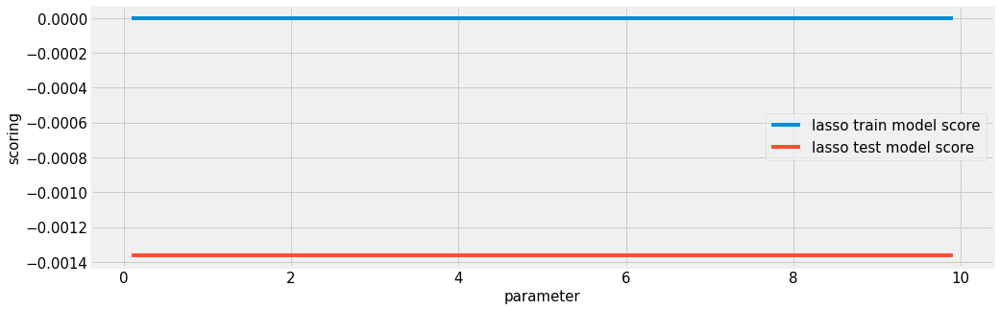

In [34]:
#visualization
plt.style.use("fivethirtyeight")
%matplotlib inline

fig= plt.subplots(figsize=(15,5))
plt.plot(result["parameter"],result["lasso train model score"],label="lasso train model score")#画折线图
plt.plot(result["parameter"],result["lasso test model score"],label="lasso test model score")
plt.rcParams.update({'font.size': 15})
plt.legend()
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("parameter",fontsize=15)
plt.ylabel("scoring",fontsize=15)

In [ ]:
#Since the performance of model is not very good, so we are not going to do the prediction but juste the selection of features

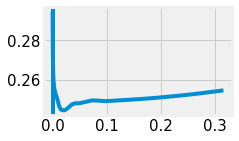

In [35]:
#lasso cross validation
 
lassocv = LassoCV(alphas=np.logspace(-3.5,-0.5,500), fit_intercept=False, positive=True, cv=5)
# cv=StratifiedShuffleSplit(n_splits=10, test_size=0.2)
lassocv.fit(X_train_lasso, y_train_lasso)

 
alpha_df = DataFrame({"alpha":lassocv.alphas_, "mse":lassocv.mse_path_.mean(1)})
best_alpha = alpha_df[alpha_df.mse == alpha_df.mse.max()].alpha
 
matplotlib.pyplot.figure(figsize=(3,2))
axvline(best_alpha.values[0])
plot(lassocv.alphas_, lassocv.mse_path_.mean(1))


In [36]:
alpha = best_alpha.values[0]
lasso = Lasso(alpha=alpha)
 
y_pred_lasso = lasso.fit(X_train_lasso, y_train_lasso).predict(X_test_lasso)
r2_score_lasso = r2_score(y_test_lasso, y_pred_lasso)
print(lasso)
print("r^2 on test data : %f" % r2_score_lasso)


Lasso(alpha=0.00031622776601683794)
r^2 on test data : -0.529822


In [37]:
#apply the best parameter
lasso = Lasso(alpha=10**(-3))
model_lasso = lasso.fit(X_train_lasso, y_train_lasso)
coef = pd.Series(model_lasso.coef_,index=X_train_lasso.columns)
print(coef[coef != 0].abs().sort_values(ascending = False))

129790    0.263364
3693      0.255492
9120      0.232740
81888     0.228643
4232      0.215346
            ...   
4674      0.000625
79094     0.000449
170626    0.000228
54979     0.000156
26871     0.000002
Length: 464, dtype: float64


In [38]:
clf = LassoCV().fit(X, Y)
importance = np.abs(clf.coef_)
print(importance)

[0. 0. 0. ... 0. 0. 0.]


In [39]:
# choose the features
idx_third = importance.argsort()[-3]
threshold = importance[idx_third] + 0.01

idx_features = (-importance).argsort()[:10]
name_features = np.array(X.columns)[idx_features]
print('Selected features: {}'.format(name_features))


Selected features: [26863 1667 10170 91663 4160 8531 2487 8653 9834 24141]


In [40]:
# Top10 features gene result choosen by lasso 
#input	    name 	                    symbol	alias (first 5)	HGNC
#8653	DEAD-box helicase 3 Y-linked	DDX3Y	DBY	HGNC:2699
#1667	defensin alpha 1	DEFA1	DEF1, DEFA2, HNP-1, HP-1, HP1	HGNC:2761
#10170	dehydrogenase/reductase 9	DHRS9	3-alpha-HSD, 3ALPHA-HSD, RDH-E2, RDH-TBE, RDH15	HGNC:16888
#9834	family with sequence similarity 30 member A	FAM30A	C14orf110, HSPC053, KIAA0125	HGNC:19955
#2487	frizzled related protein	FRZB	FRE, FRITZ, FRP-3, FRZB-1, FRZB-PEN	HGNC:3959
#24141	lysosomal associated membrane protein family member 5	LAMP5	BAD-LAMP, BADLAMP, C20orf103, LAMP-5, UNC-46	HGNC:16097
#4160	melanocortin 4 receptor	MC4R	BMIQ20	HGNC:6932
#91663	myeloid associated differentiation marker	MYADM	SB135	HGNC:7544
#26863	RNA, variant U1 small nuclear 18	RNVU1-18	RNU1-25, RNU1-25P, RNU1-5, RNU1P1, RNU1P9	HGNC:37496
#8531	Y-box binding protein 3	YBX3	CSDA, CSDA1, DBPA, ZONAB	HGNC:2428

In [41]:
print("="*40, "System Information", "="*40)
uname = platform.uname()
print(f"System: {uname.system}")
print(f"Node Name: {uname.node}")
print(f"Release: {uname.release}")
print(f"Version: {uname.version}")
print(f"Machine: {uname.machine}")
print(f"Processor: {uname.processor}")

======================================== System Information ========================================
System: Darwin
Node Name: Xinyue
Release: 20.3.0
Version: Darwin Kernel Version 20.3.0: Thu Jan 21 00:07:06 PST 2021; root:xnu-7195.81.3~1/RELEASE_X86_64
Machine: x86_64
Processor: i386


In [ ]:
#the convert of data informations is based on site: https://www.syngoportal.org/convert